In [1]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
import pandas as pd
from datetime import datetime
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.model_selection import train_test_split
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import VotingRegressor
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
import warnings
import matplotlib.pyplot as plt
df = pd.read_csv('stations_data.csv', sep=',')
def map_to_five(x):
    return min(x, 5)
df['rounded_last_update_5mins'] = pd.to_datetime(df['rounded_last_update_5mins'])
df['time_as_fraction'] = df['rounded_last_update_5mins'].dt.hour * 3600 + df['rounded_last_update_5mins'].dt.minute * 60 + df['rounded_last_update_5mins'].dt.second
df['day'] = df['rounded_last_update_5mins'].dt.day
df['month'] = df['rounded_last_update_5mins'].dt.month
weekday=df['rounded_last_update_5mins'].dt.dayofweek
weekdaydf = pd.get_dummies(weekday, prefix='day_of_week')
df = pd.concat([df, weekdaydf], axis=1)
print(df.columns)


Index(['number', 'name', 'position_lat', 'position_lng', 'available_bikes',
       'available_bike_stands', 'rounded_last_update',
       'rounded_last_update_5mins', 'temp', 'feels_like', 'humidity',
       'rain_1h', 'weather_desc', 'weather_brief', 'wind_speed', 'weatherid',
       'time_as_fraction', 'day', 'month', 'day_of_week_0', 'day_of_week_1',
       'day_of_week_2', 'day_of_week_3', 'day_of_week_4', 'day_of_week_5',
       'day_of_week_6'],
      dtype='object')


In [3]:
x_set = df[['number','time_as_fraction','month','day','day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','day_of_week_5','day_of_week_6','temp','feels_like','rain_1h','wind_speed','weatherid']]
y_set = df['available_bikes']
print(x_set.shape)





(622721, 16)


In [5]:
station_number = x_set['number'].unique()
print(station_number)
x_set.columns

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  47  48  49  50  51  52  53  54  55
  56  57  58  59  60  61  62  63  64  65  66  67  68  69  71  72  73  74
  75  76  77  78  79  80  82  83  84  85  86  87  88  89  90  91  92  93
  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111
 112 113 114 115 116 117]


Index(['number', 'time_as_fraction', 'month', 'day', 'day_of_week_0',
       'day_of_week_1', 'day_of_week_2', 'day_of_week_3', 'day_of_week_4',
       'day_of_week_5', 'day_of_week_6', 'temp', 'feels_like', 'rain_1h',
       'wind_speed', 'weatherid'],
      dtype='object')

In [6]:
def r_squared(y_true, y_pred):
   
    residual_sum_of_squares = np.sum(np.square(y_true - y_pred))
    total_sum_of_squares = np.sum(np.square(y_true - np.mean(y_true)))
    return 1 - (residual_sum_of_squares / total_sum_of_squares)

R^2: 0.94, Accuracy: 39.69%, MSE: 5.43


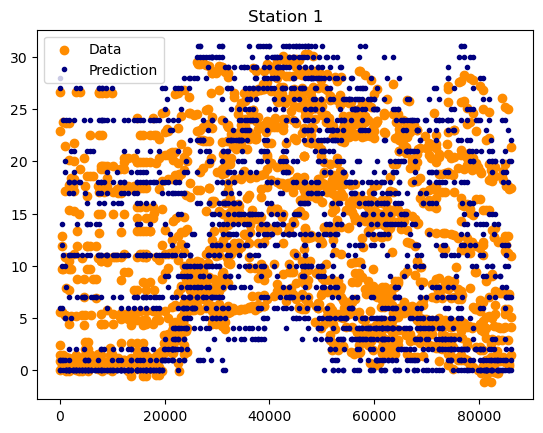

R^2: 0.91, Accuracy: 59.77%, MSE: 2.09


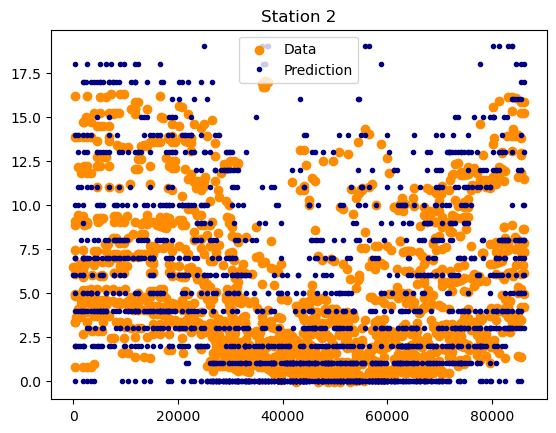

R^2: 0.94, Accuracy: 56.03%, MSE: 2.03


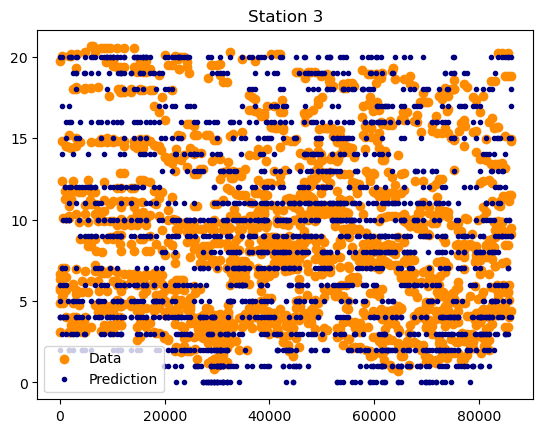

R^2: 0.94, Accuracy: 64.38%, MSE: 1.75


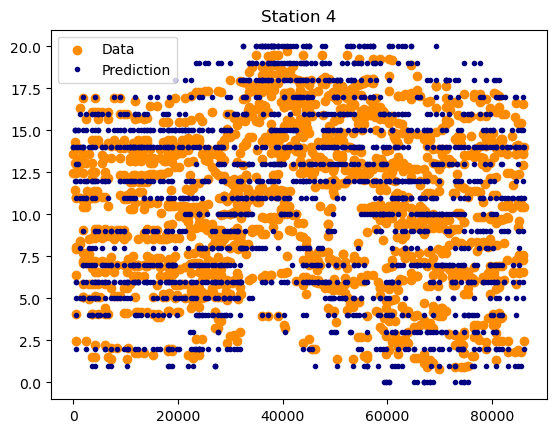

R^2: 0.95, Accuracy: 26.53%, MSE: 10.09


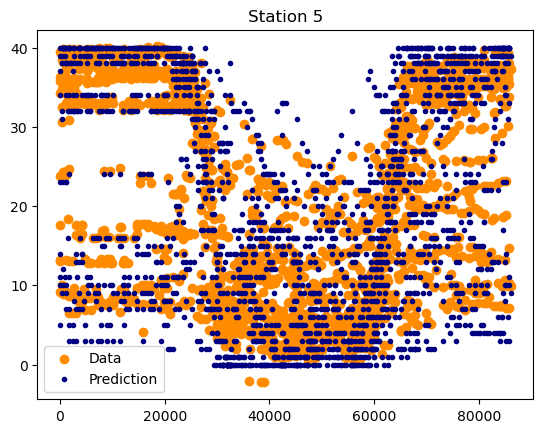

R^2: 0.94, Accuracy: 63.51%, MSE: 1.44


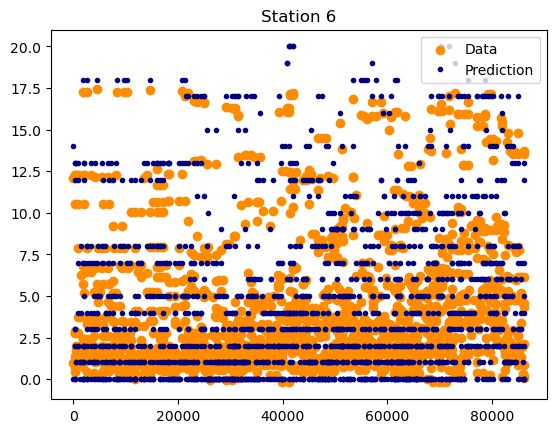

R^2: 0.93, Accuracy: 44.48%, MSE: 3.95


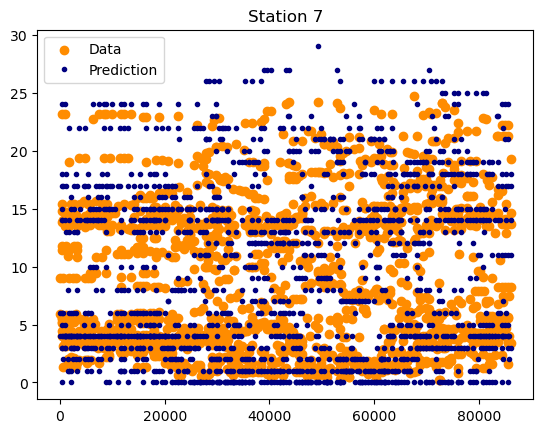

R^2: 0.90, Accuracy: 33.99%, MSE: 6.16


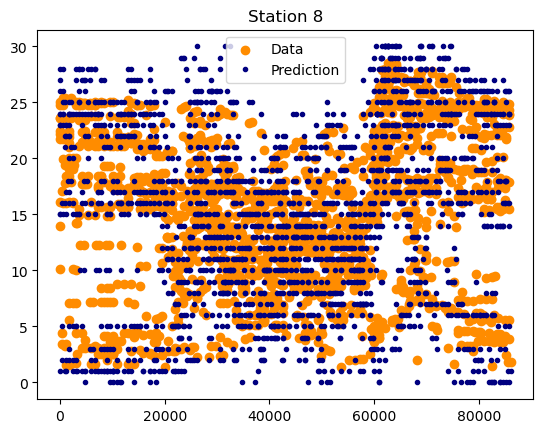

R^2: 0.90, Accuracy: 35.71%, MSE: 5.42


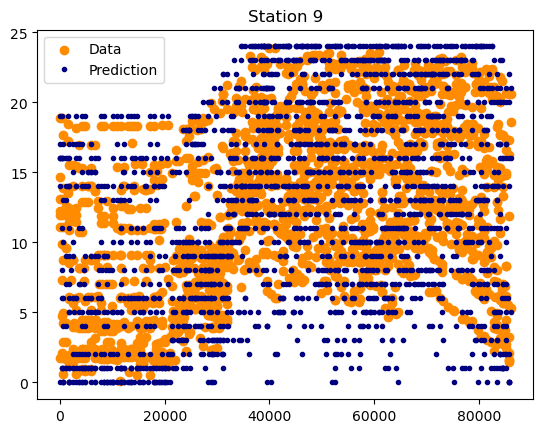

R^2: 0.88, Accuracy: 57.33%, MSE: 2.23


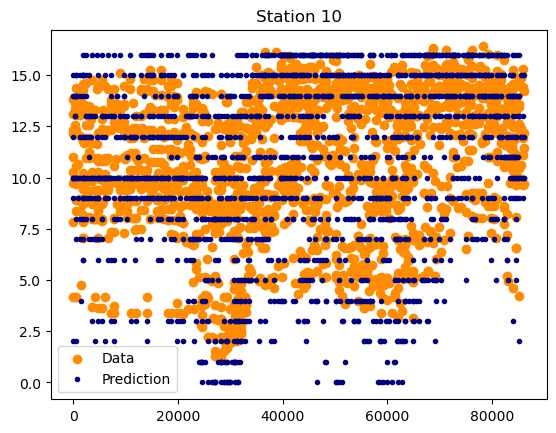

R^2: 0.96, Accuracy: 68.95%, MSE: 1.69


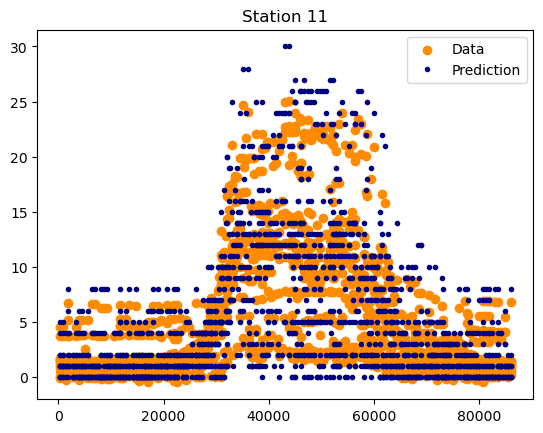

R^2: 0.93, Accuracy: 63.05%, MSE: 1.58


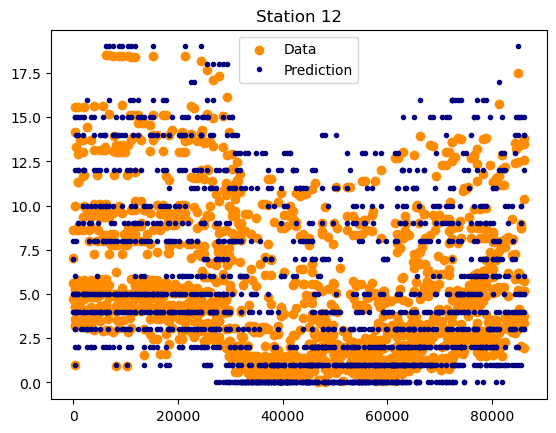

R^2: 0.96, Accuracy: 76.48%, MSE: 0.88


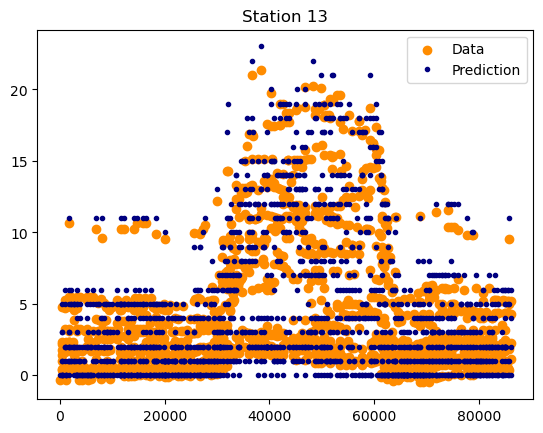

R^2: 0.90, Accuracy: 34.00%, MSE: 6.56


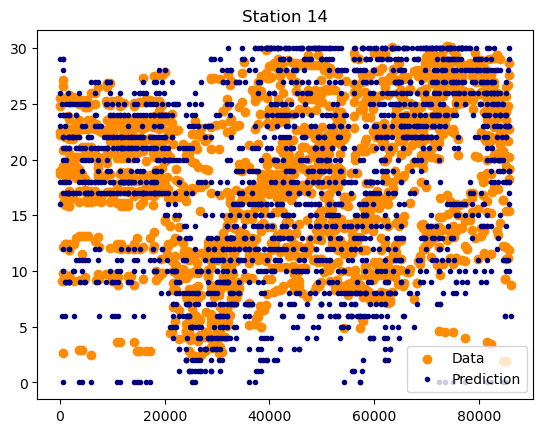

R^2: 0.89, Accuracy: 68.57%, MSE: 1.25


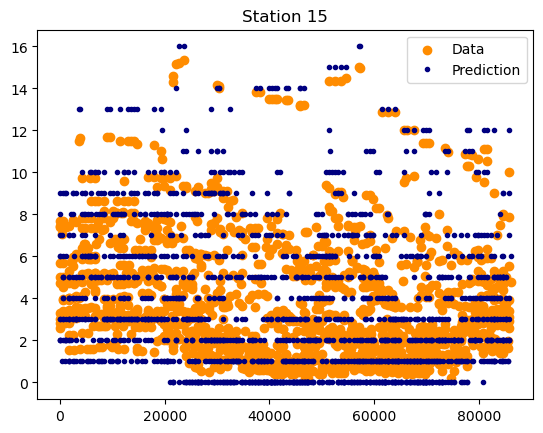

R^2: 0.91, Accuracy: 52.59%, MSE: 2.45


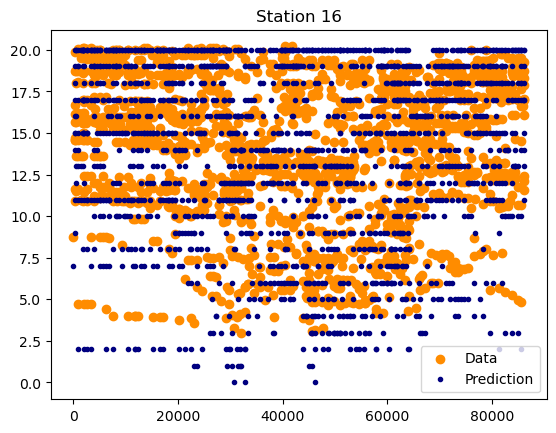

R^2: 0.92, Accuracy: 81.37%, MSE: 0.66


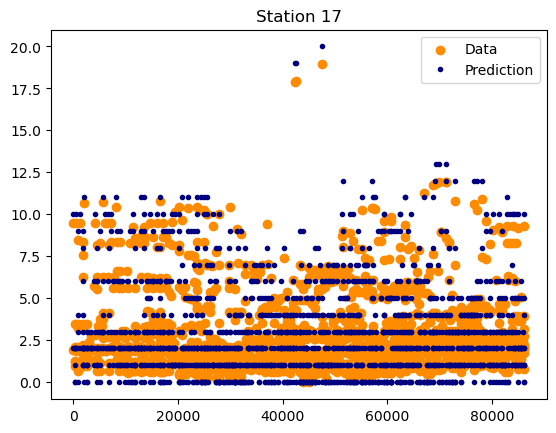

R^2: 0.92, Accuracy: 41.93%, MSE: 3.47


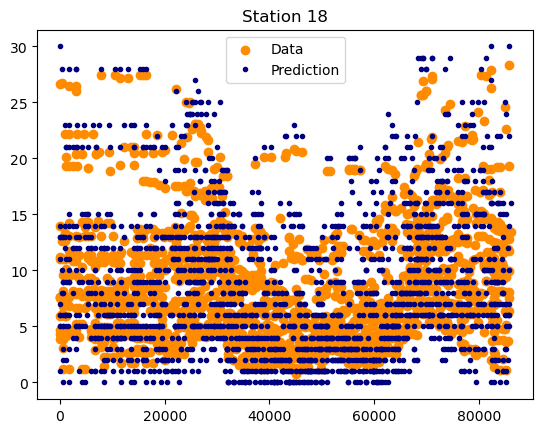

R^2: 0.95, Accuracy: 42.63%, MSE: 4.58


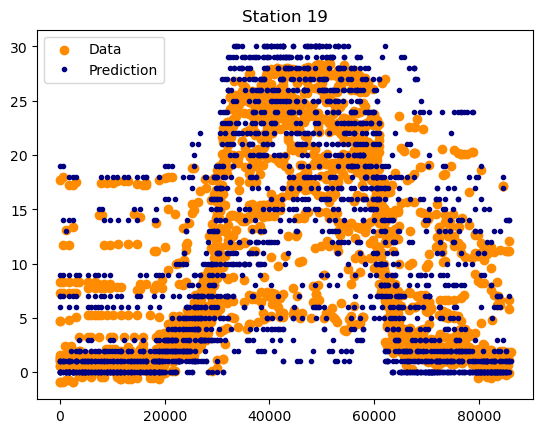

R^2: 0.97, Accuracy: 56.80%, MSE: 2.69


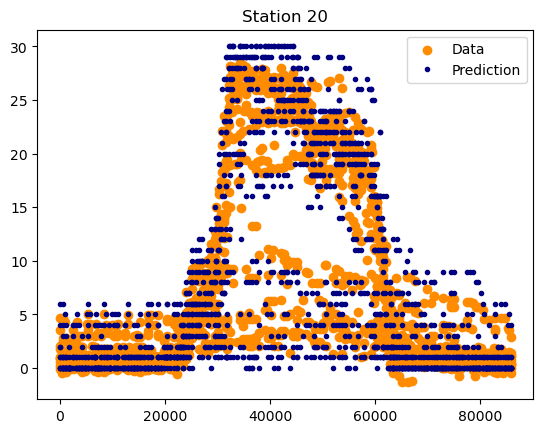

R^2: 0.91, Accuracy: 33.37%, MSE: 6.56


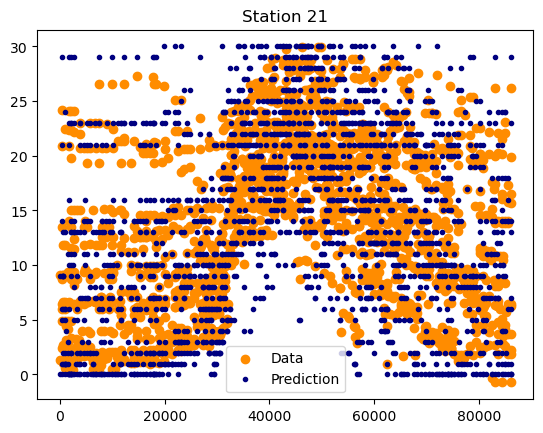

R^2: 0.92, Accuracy: 43.50%, MSE: 2.88


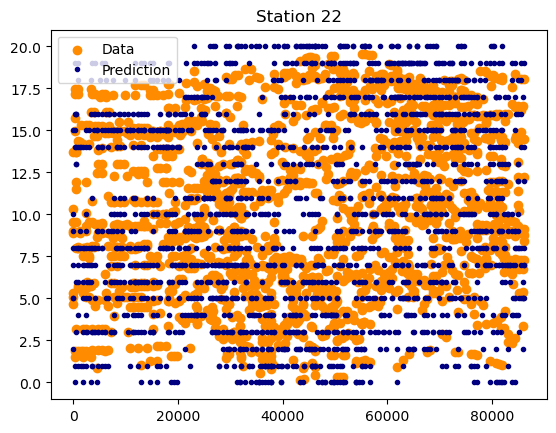

R^2: 0.94, Accuracy: 37.12%, MSE: 5.84


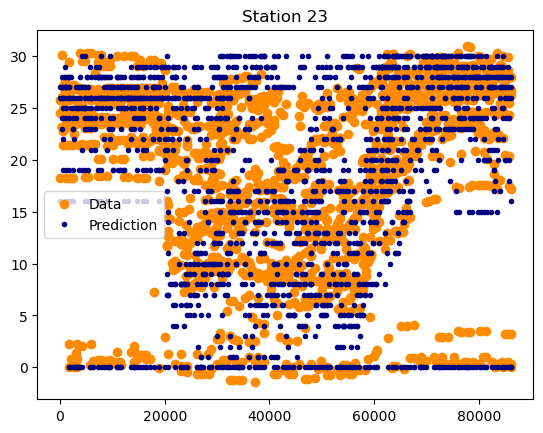

R^2: 0.91, Accuracy: 43.20%, MSE: 3.21


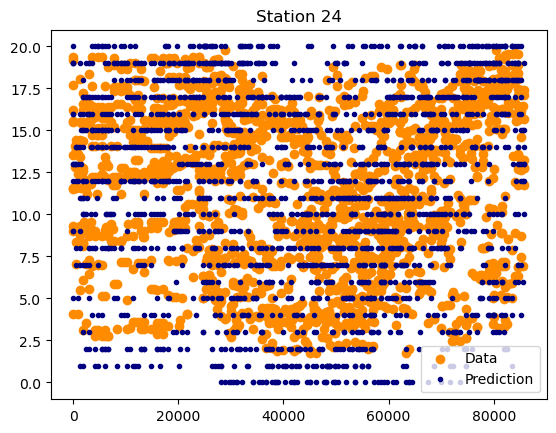

R^2: 0.97, Accuracy: 60.22%, MSE: 1.89


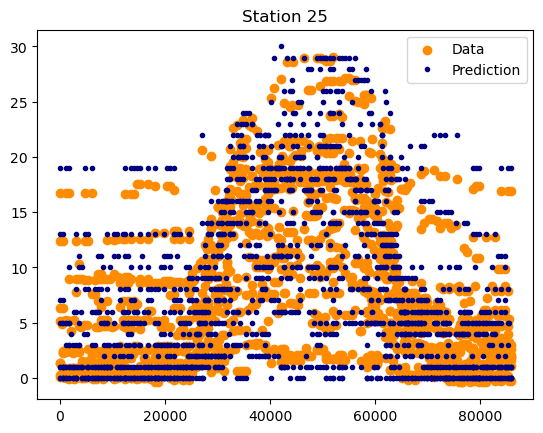

R^2: 0.94, Accuracy: 52.58%, MSE: 2.31


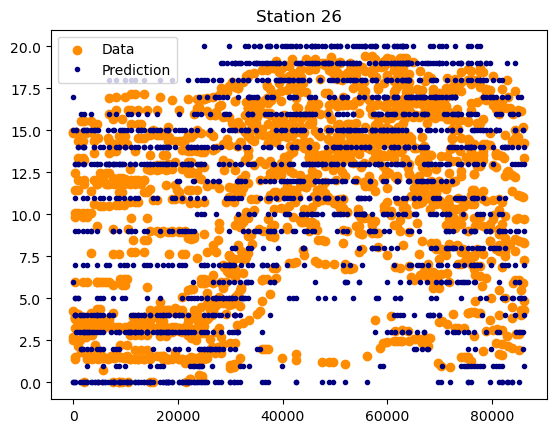

R^2: 0.94, Accuracy: 54.87%, MSE: 2.09


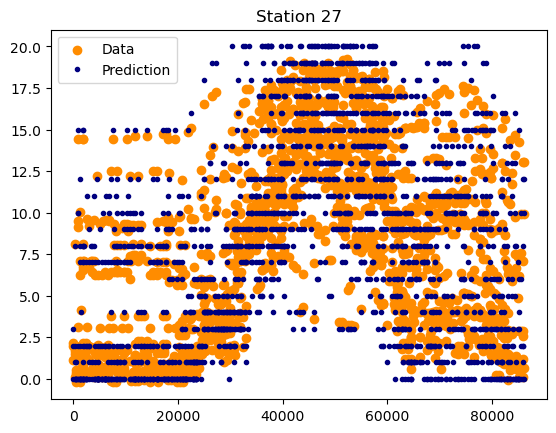

R^2: 0.86, Accuracy: 33.81%, MSE: 6.81


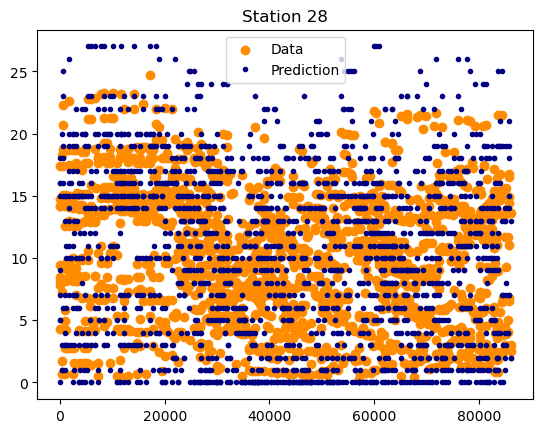

R^2: 0.91, Accuracy: 34.78%, MSE: 5.57


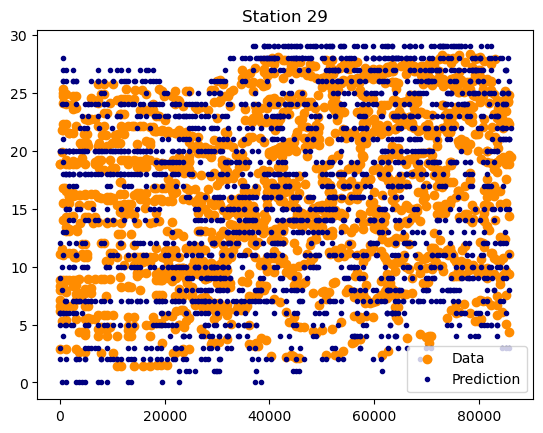

R^2: 0.93, Accuracy: 85.40%, MSE: 0.54


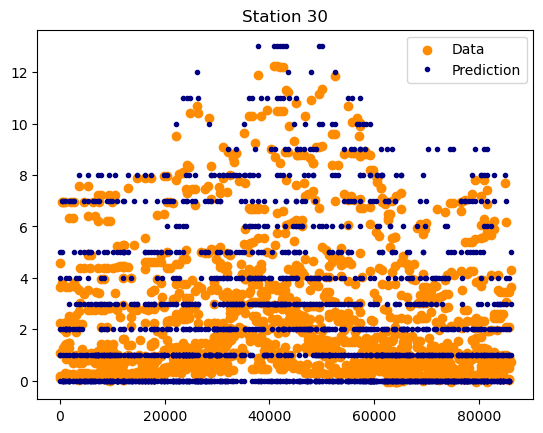

R^2: 0.86, Accuracy: 40.35%, MSE: 4.40


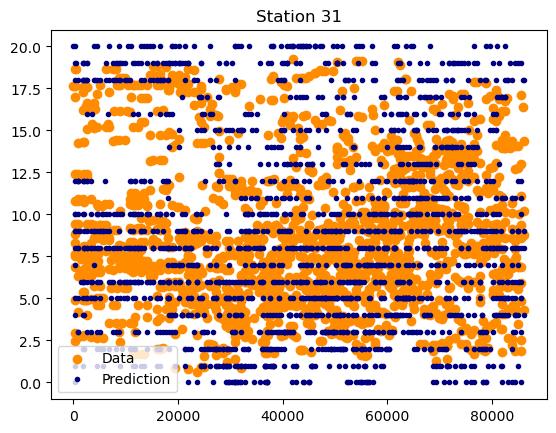

R^2: 0.89, Accuracy: 34.92%, MSE: 6.39


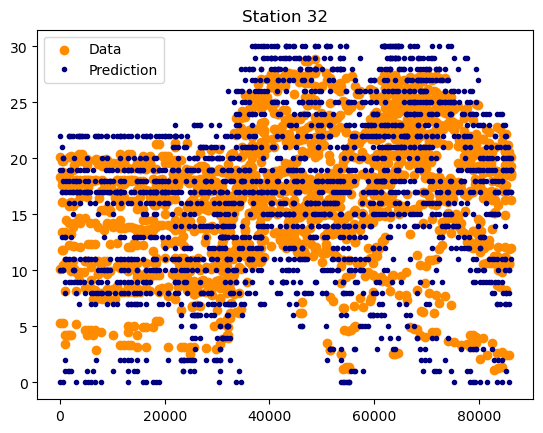

R^2: 0.81, Accuracy: 32.43%, MSE: 6.51


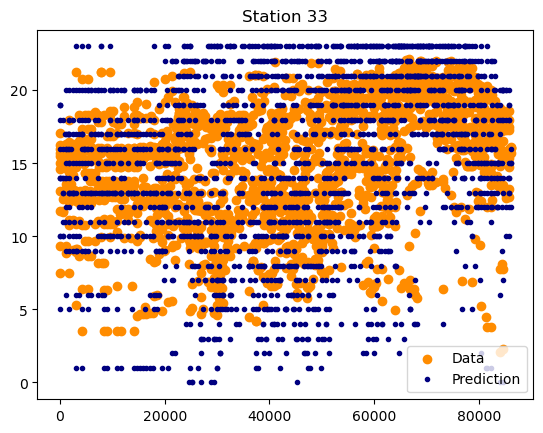

R^2: 0.94, Accuracy: 33.83%, MSE: 6.09


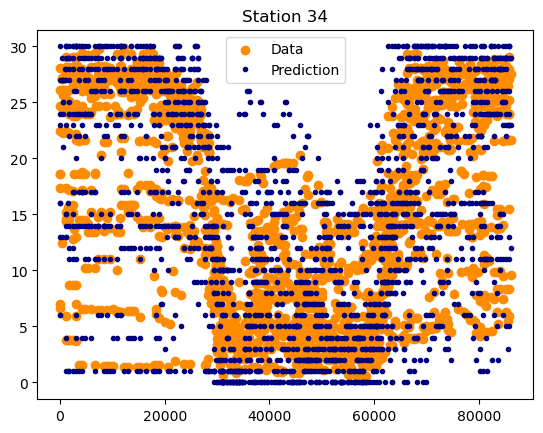

R^2: 0.97, Accuracy: 49.67%, MSE: 2.72


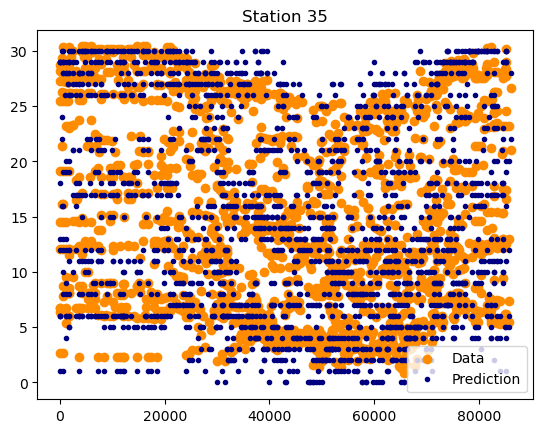

R^2: 0.93, Accuracy: 37.31%, MSE: 5.51


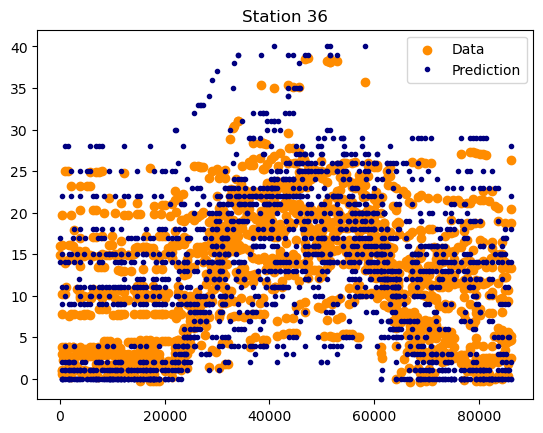

R^2: 0.97, Accuracy: 75.43%, MSE: 0.90


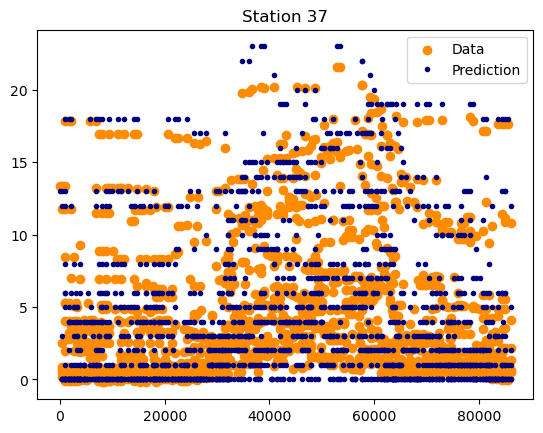

R^2: 0.94, Accuracy: 42.19%, MSE: 3.64


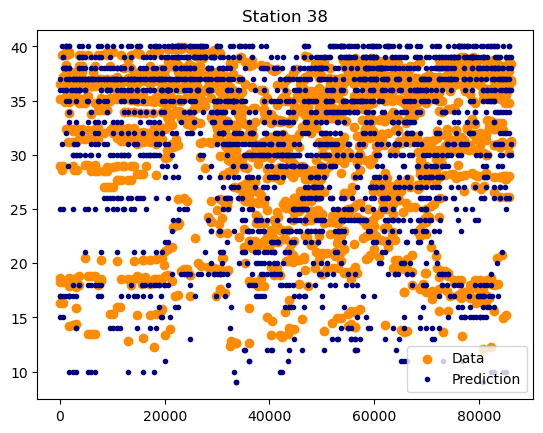

R^2: 0.87, Accuracy: 55.23%, MSE: 2.03


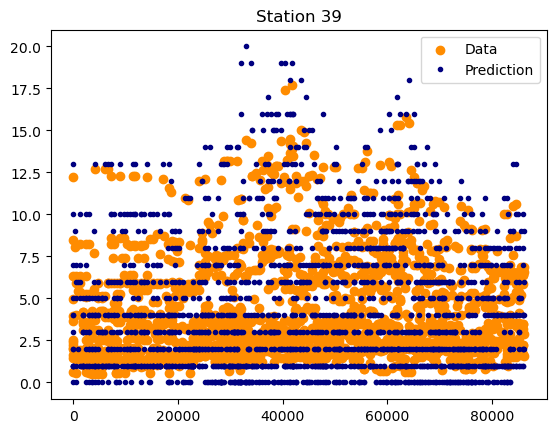

R^2: 0.90, Accuracy: 43.26%, MSE: 3.90


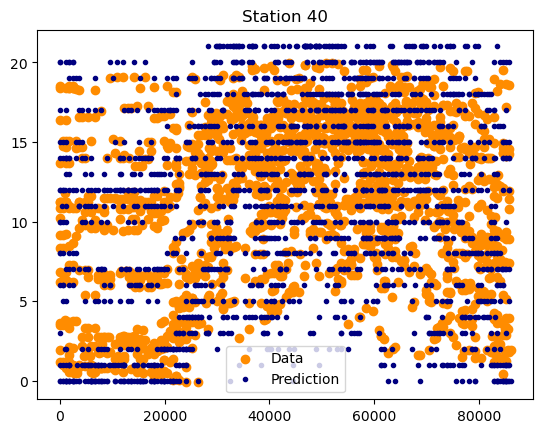

R^2: 0.94, Accuracy: 64.97%, MSE: 1.89


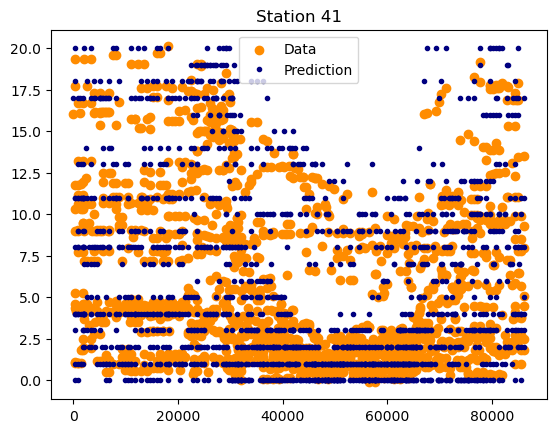

R^2: 0.97, Accuracy: 55.49%, MSE: 2.32


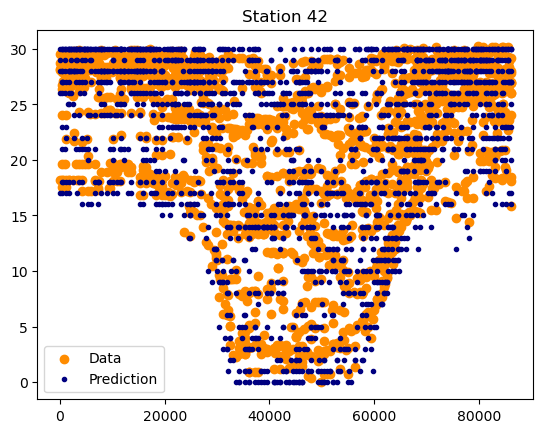

R^2: 0.96, Accuracy: 43.57%, MSE: 4.27


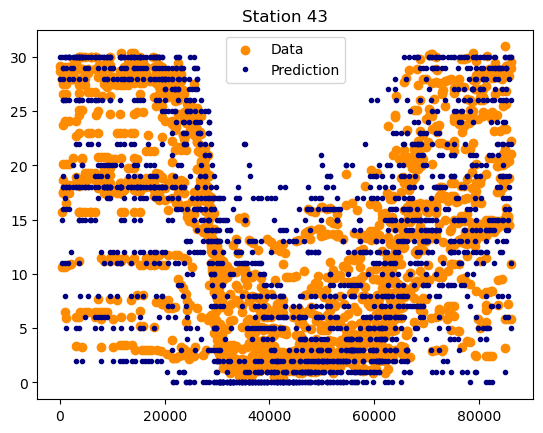

R^2: 0.97, Accuracy: 56.54%, MSE: 2.02


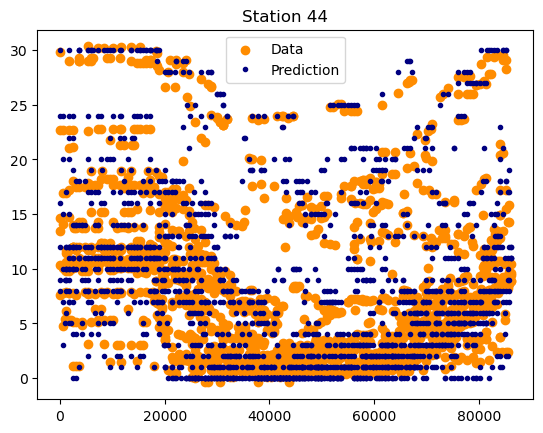

R^2: 0.95, Accuracy: 47.31%, MSE: 3.16


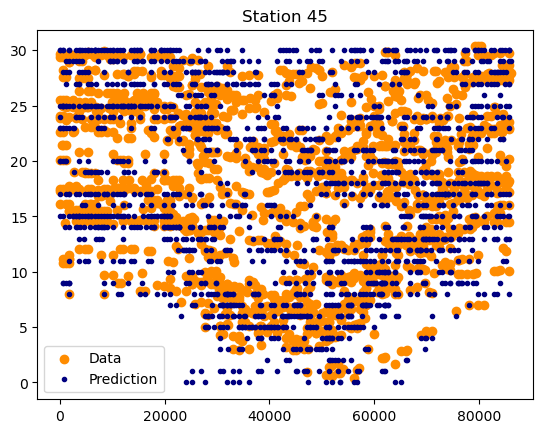

R^2: 0.96, Accuracy: 69.04%, MSE: 1.44


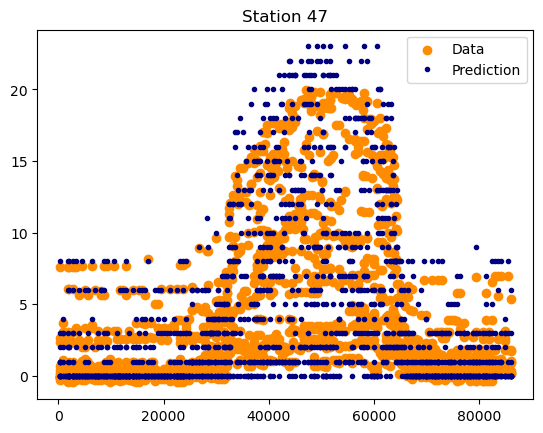

R^2: 0.96, Accuracy: 49.32%, MSE: 3.04


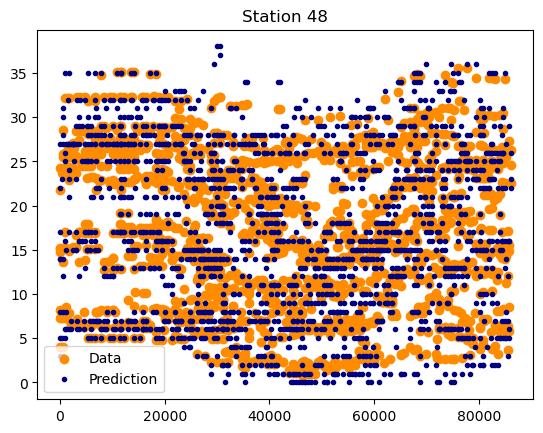

R^2: 0.95, Accuracy: 39.91%, MSE: 5.32


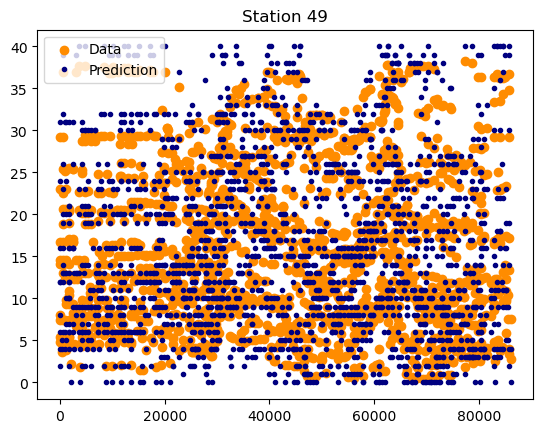

R^2: 0.98, Accuracy: 43.81%, MSE: 3.49


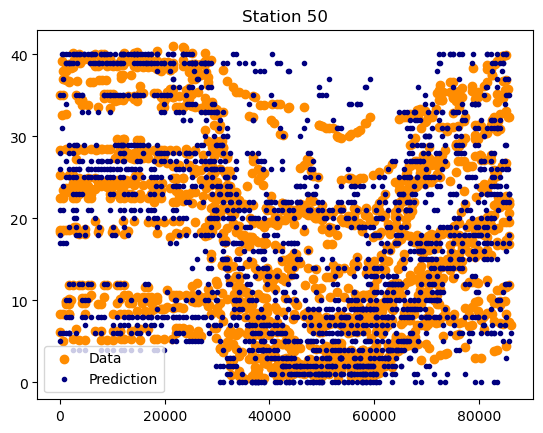

R^2: 0.97, Accuracy: 66.00%, MSE: 1.33


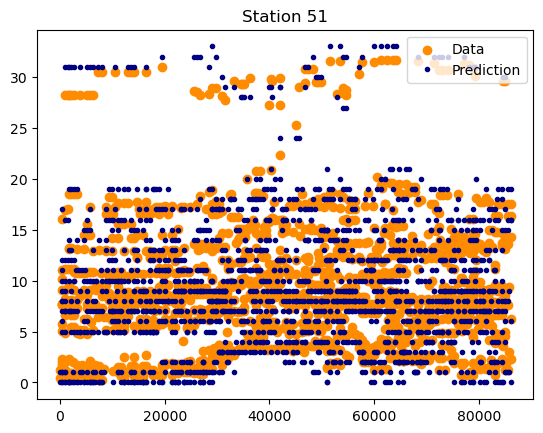

R^2: 0.98, Accuracy: 60.94%, MSE: 1.64


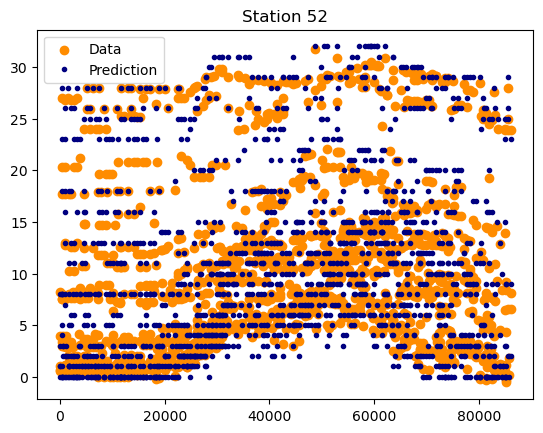

R^2: 0.97, Accuracy: 65.94%, MSE: 1.24


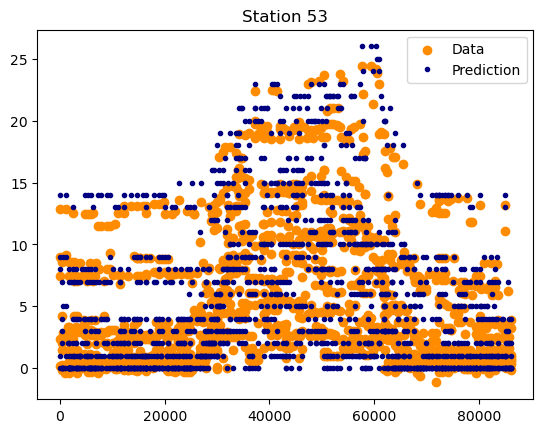

R^2: 0.97, Accuracy: 57.29%, MSE: 2.02


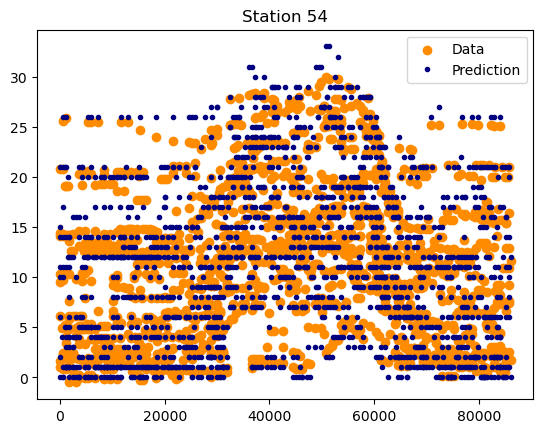

R^2: 0.98, Accuracy: 65.95%, MSE: 1.72


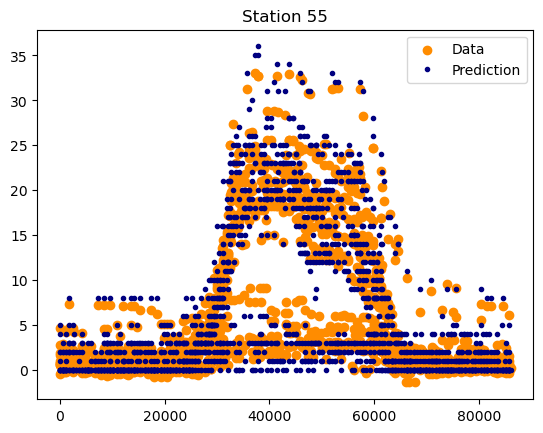

R^2: 0.96, Accuracy: 39.42%, MSE: 4.72


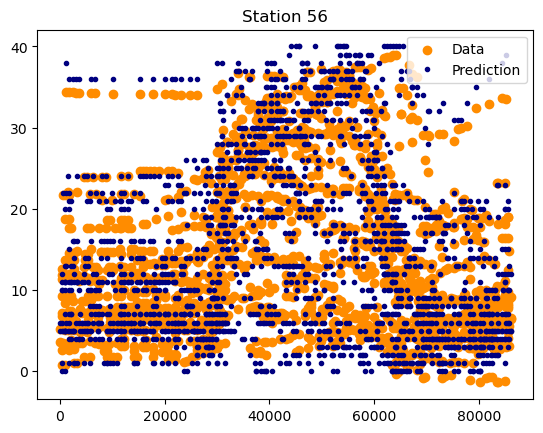

R^2: 0.96, Accuracy: 61.68%, MSE: 1.71


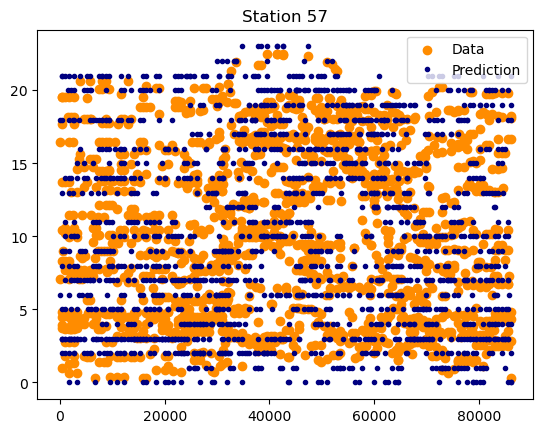

R^2: 0.94, Accuracy: 31.24%, MSE: 7.70


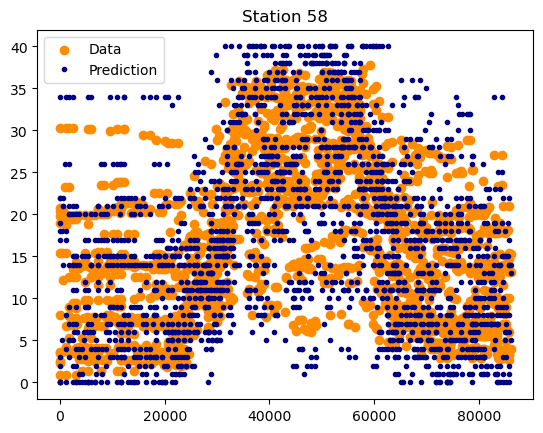

R^2: 0.91, Accuracy: 68.07%, MSE: 1.43


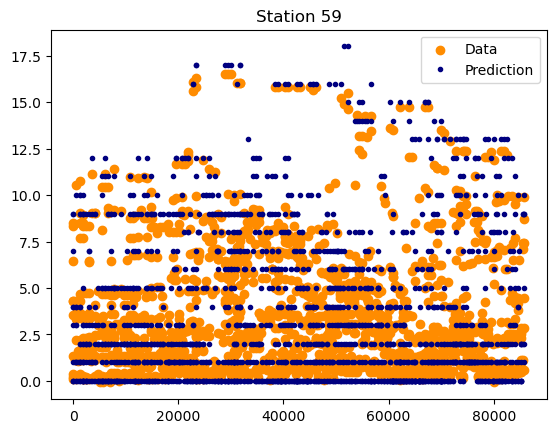

R^2: 0.95, Accuracy: 43.66%, MSE: 4.34


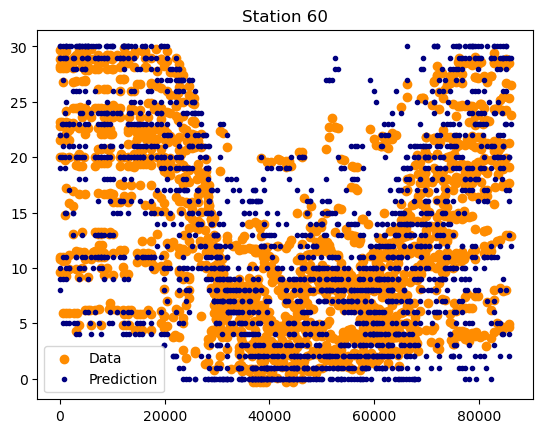

R^2: 0.92, Accuracy: 63.86%, MSE: 2.54


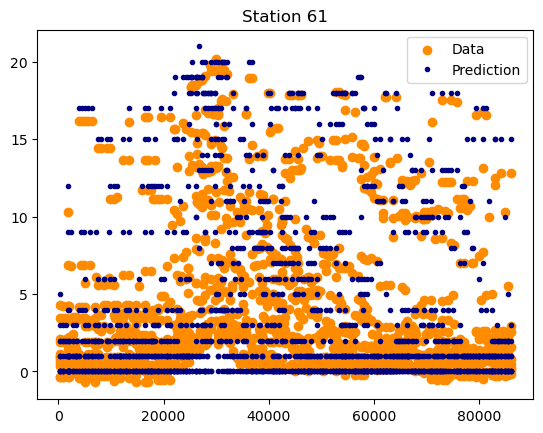

R^2: 0.97, Accuracy: 49.92%, MSE: 2.96


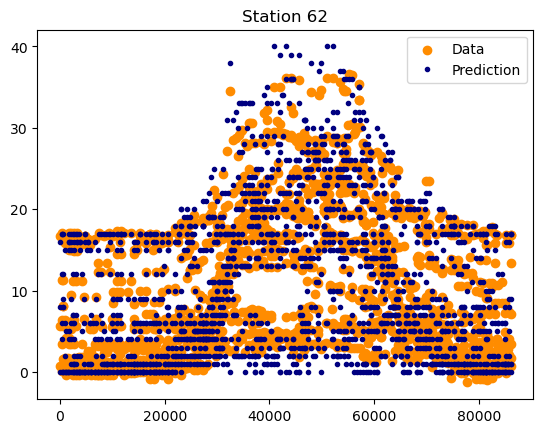

R^2: 0.95, Accuracy: 57.90%, MSE: 2.33


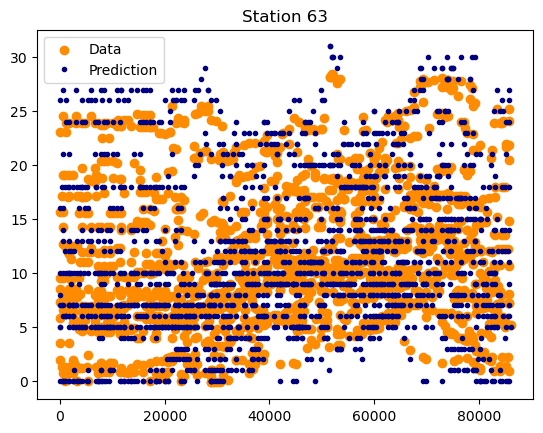

R^2: 0.95, Accuracy: 35.32%, MSE: 5.34


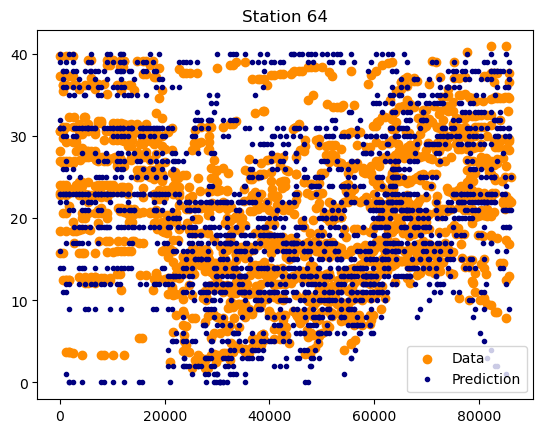

R^2: 0.96, Accuracy: 51.27%, MSE: 4.04


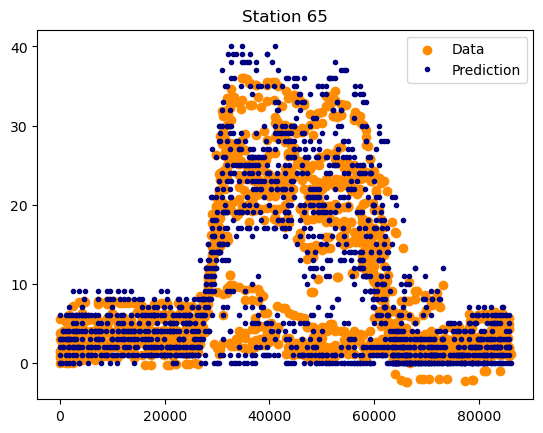

R^2: 0.93, Accuracy: 37.60%, MSE: 5.21


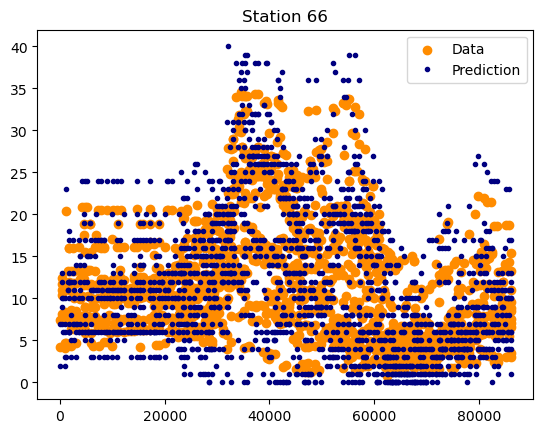

R^2: 0.95, Accuracy: 40.51%, MSE: 5.45


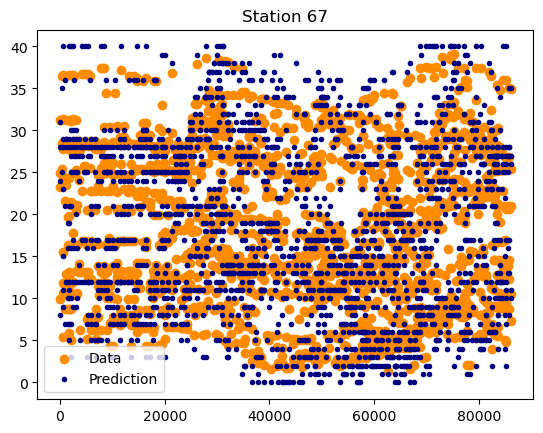

R^2: 0.96, Accuracy: 32.94%, MSE: 5.91


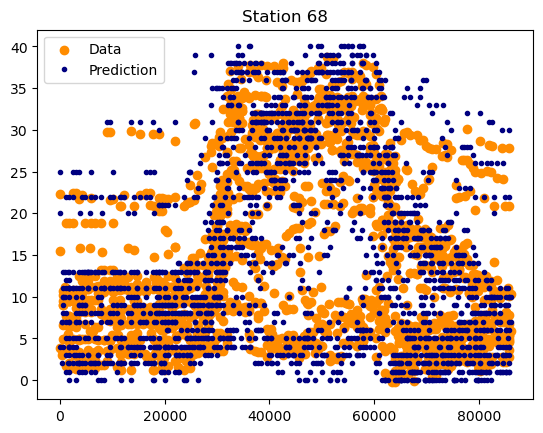

R^2: 0.95, Accuracy: 31.04%, MSE: 6.94


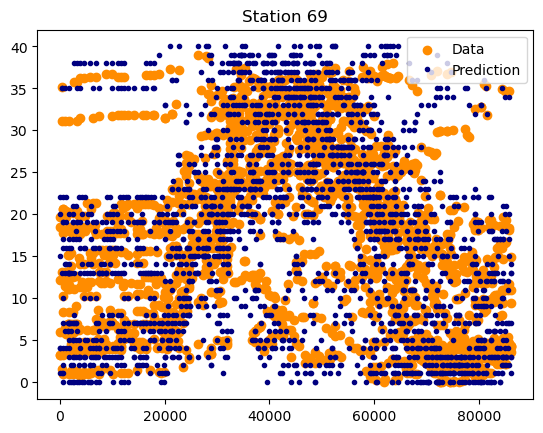

R^2: 0.95, Accuracy: 60.63%, MSE: 1.68


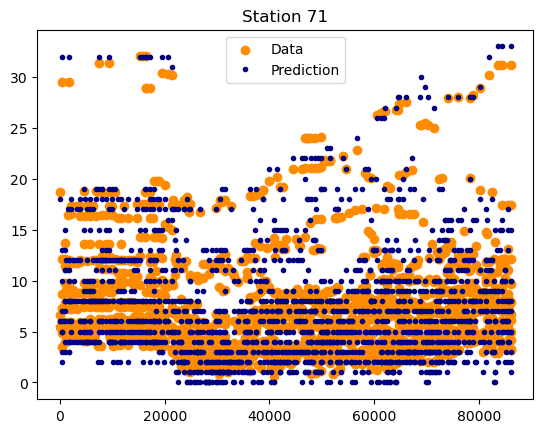

R^2: 0.89, Accuracy: 46.50%, MSE: 3.34


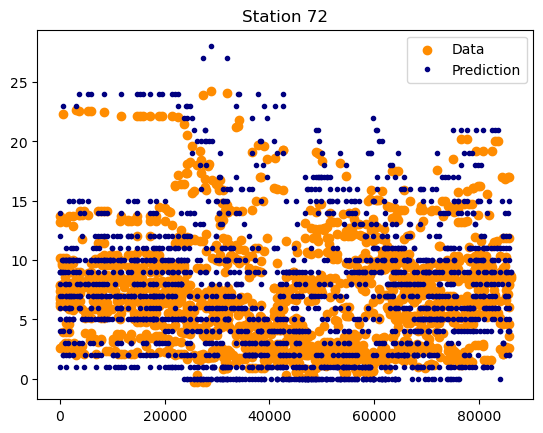

R^2: 0.93, Accuracy: 53.43%, MSE: 2.53


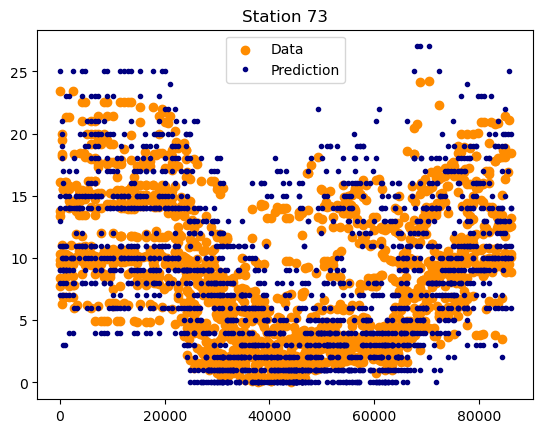

R^2: 0.96, Accuracy: 50.26%, MSE: 2.76


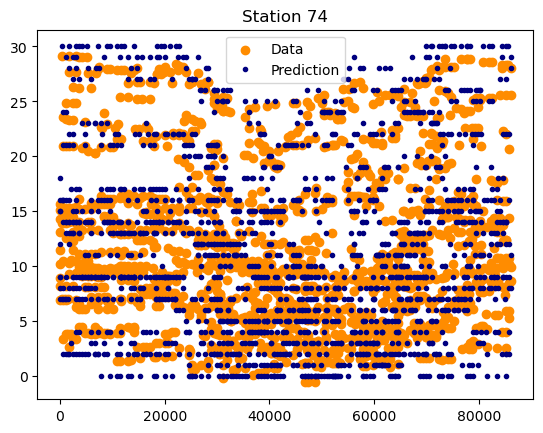

R^2: 0.93, Accuracy: 35.98%, MSE: 5.19


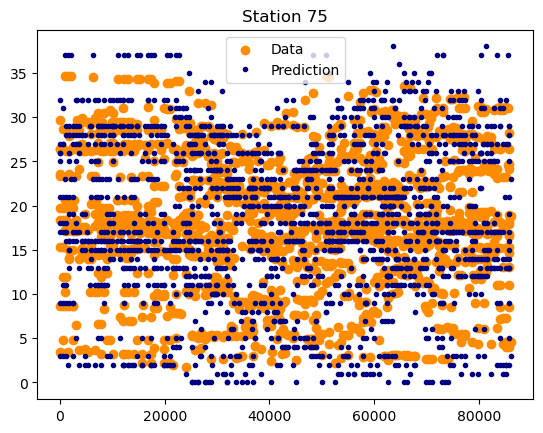

R^2: 0.91, Accuracy: 37.63%, MSE: 5.19


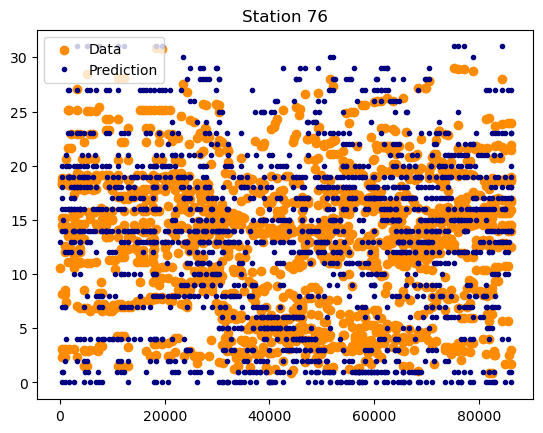

R^2: 0.96, Accuracy: 52.26%, MSE: 2.41


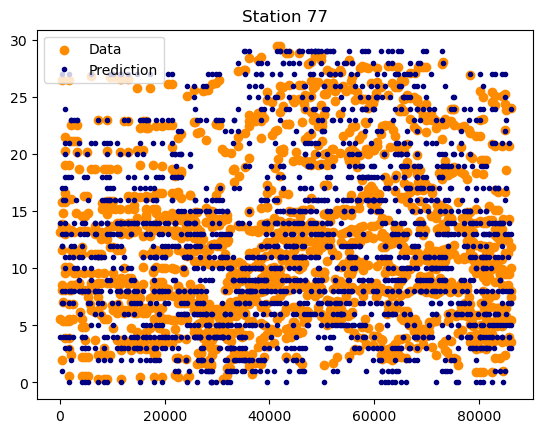

R^2: 0.96, Accuracy: 54.81%, MSE: 3.14


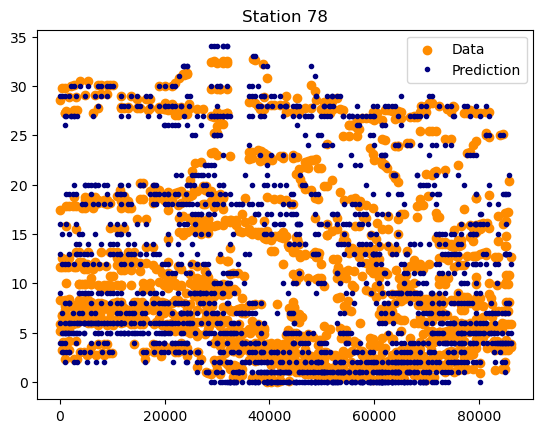

R^2: 0.94, Accuracy: 79.90%, MSE: 0.88


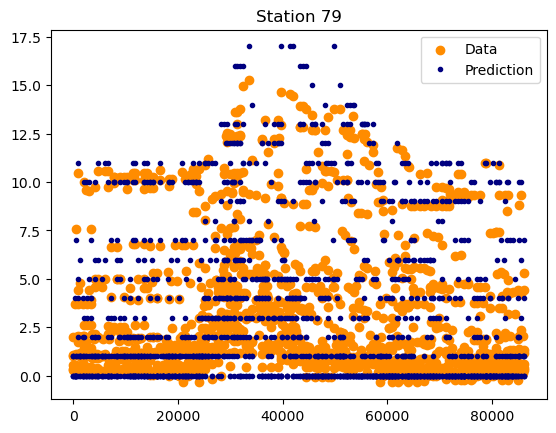

R^2: 0.88, Accuracy: 30.54%, MSE: 7.86


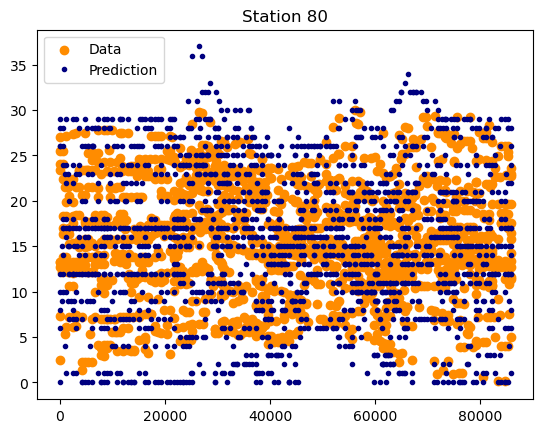

R^2: 0.98, Accuracy: 75.02%, MSE: 0.92


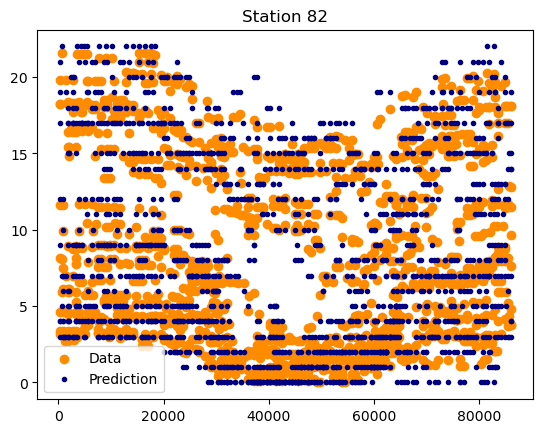

R^2: 0.96, Accuracy: 44.20%, MSE: 3.38


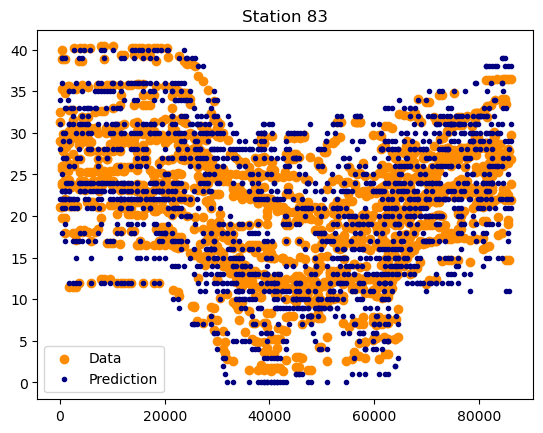

R^2: 0.95, Accuracy: 53.60%, MSE: 2.43


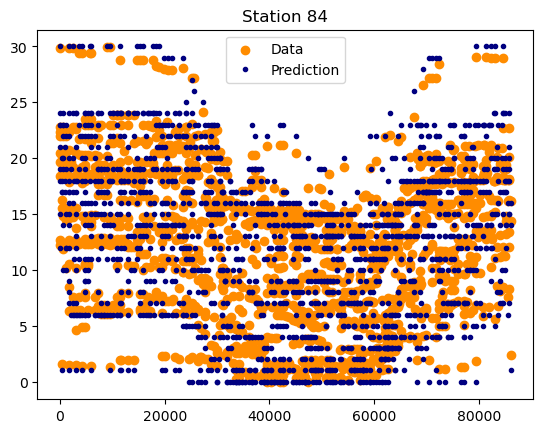

R^2: 0.95, Accuracy: 43.11%, MSE: 4.33


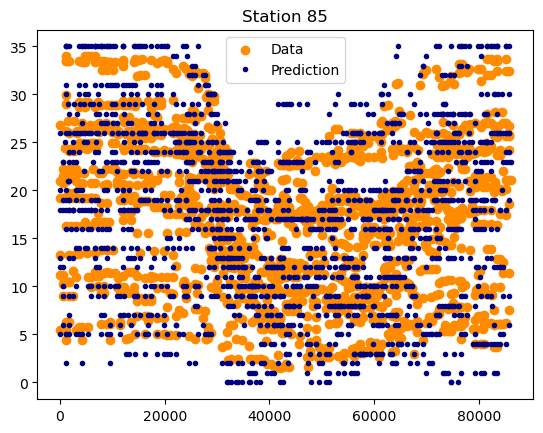

R^2: 0.97, Accuracy: 39.23%, MSE: 5.39


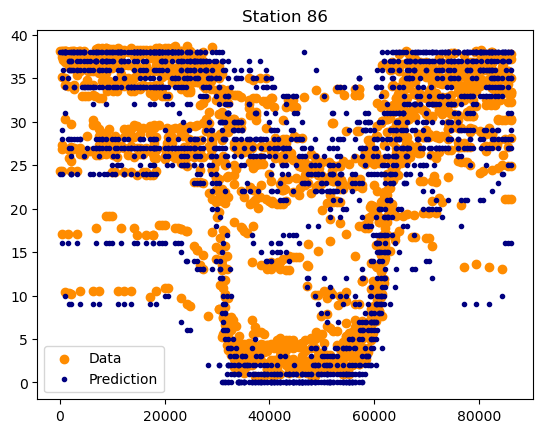

R^2: 0.97, Accuracy: 52.07%, MSE: 2.43


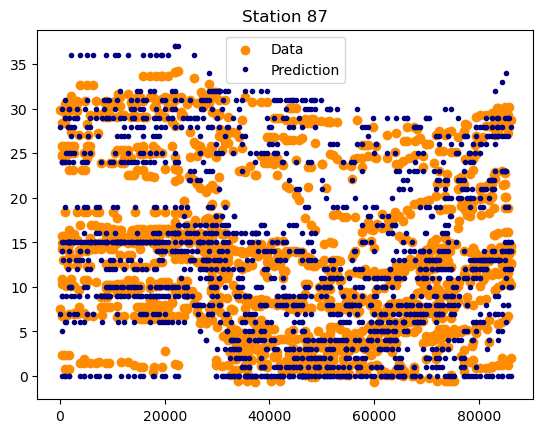

R^2: 0.97, Accuracy: 57.09%, MSE: 1.93


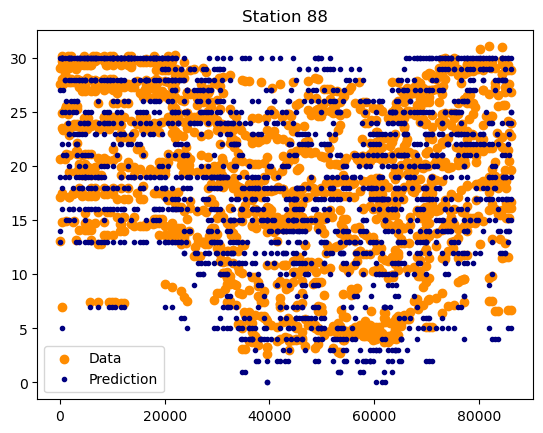

R^2: 0.95, Accuracy: 79.40%, MSE: 0.90


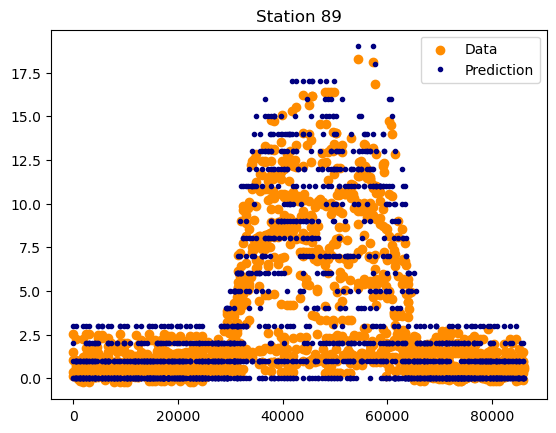

R^2: 0.96, Accuracy: 35.90%, MSE: 5.64


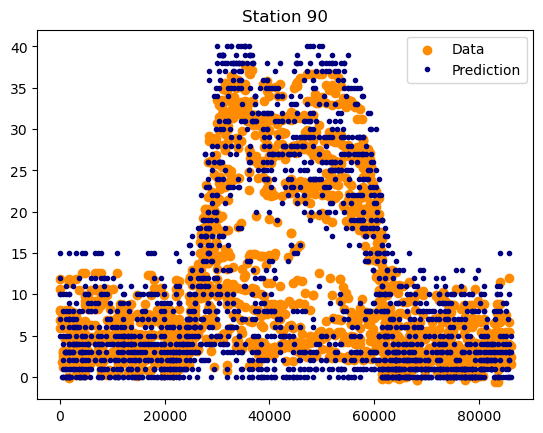

R^2: 0.93, Accuracy: 38.68%, MSE: 4.72


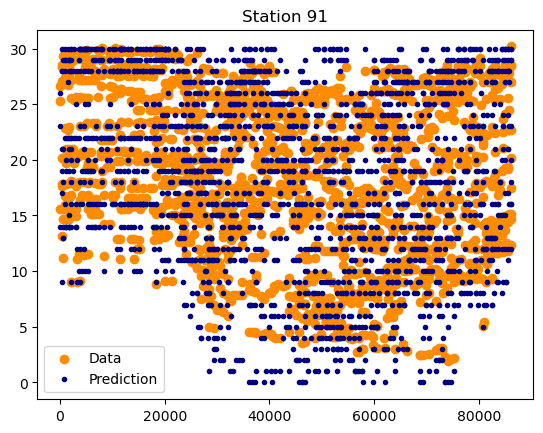

R^2: 0.97, Accuracy: 37.53%, MSE: 5.56


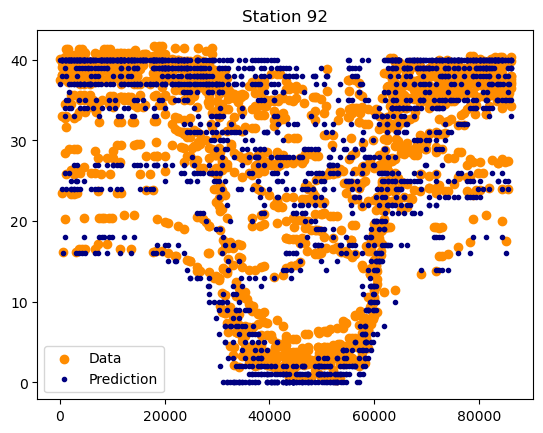

R^2: 0.97, Accuracy: 32.23%, MSE: 7.20


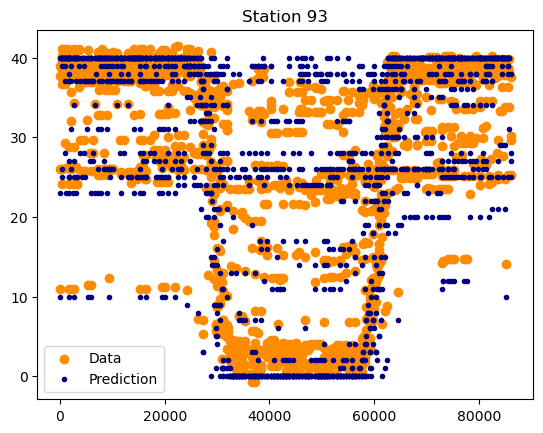

R^2: 0.97, Accuracy: 54.48%, MSE: 3.15


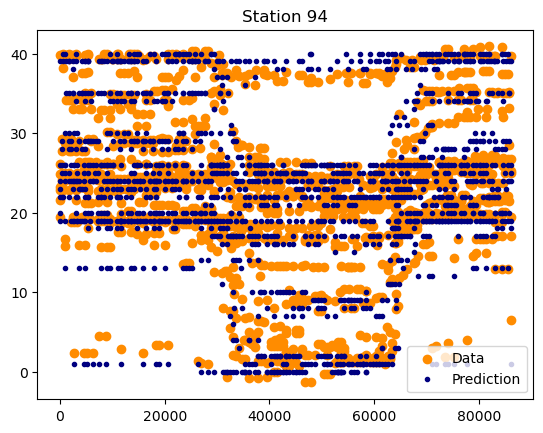

R^2: 0.95, Accuracy: 50.14%, MSE: 3.80


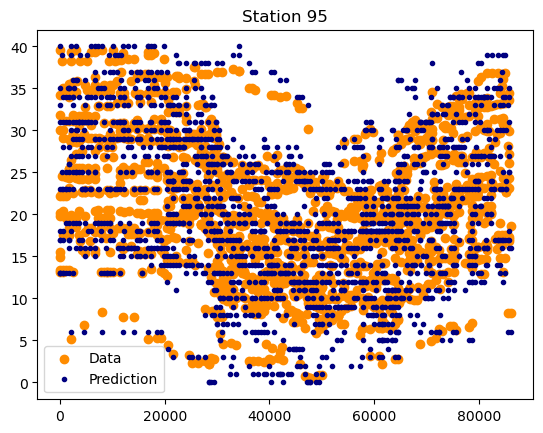

R^2: 0.96, Accuracy: 54.01%, MSE: 2.68


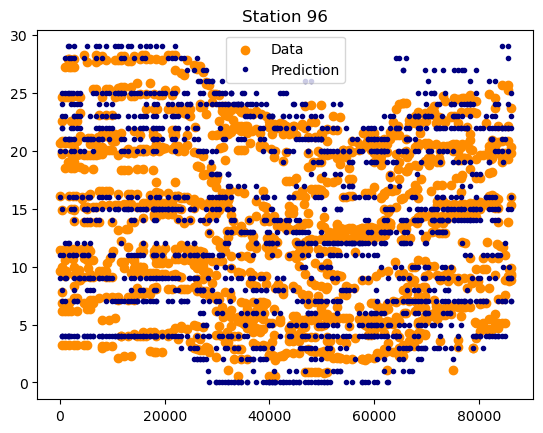

R^2: 0.92, Accuracy: 39.11%, MSE: 6.57


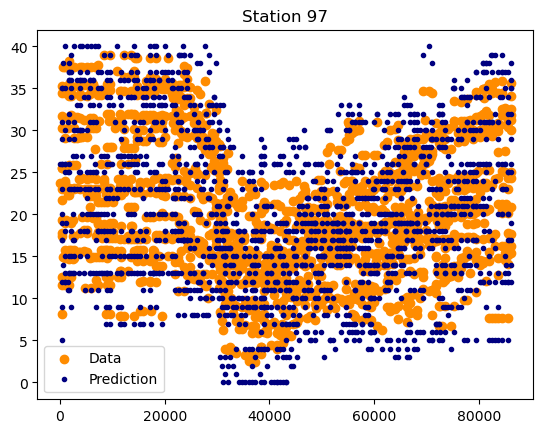

R^2: 0.98, Accuracy: 49.48%, MSE: 3.36


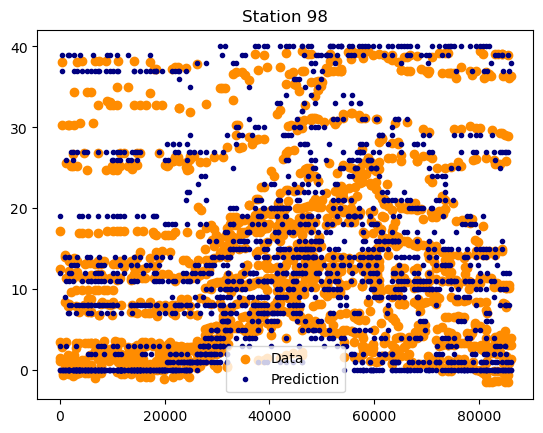

R^2: 0.97, Accuracy: 63.63%, MSE: 1.67


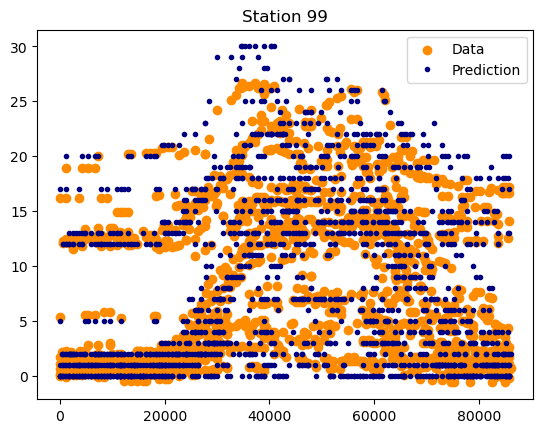

R^2: 0.94, Accuracy: 44.33%, MSE: 4.44


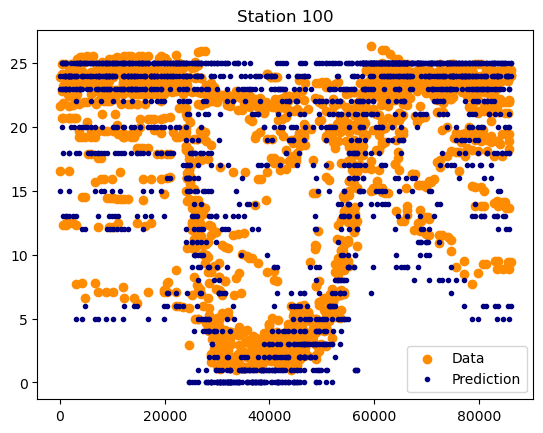

R^2: 0.96, Accuracy: 54.43%, MSE: 1.88


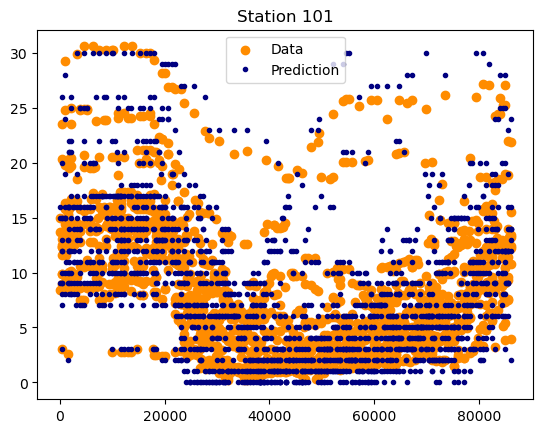

R^2: 0.91, Accuracy: 39.34%, MSE: 4.18


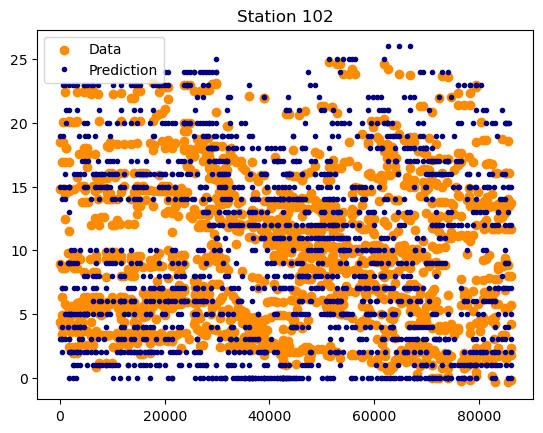

R^2: 0.95, Accuracy: 70.37%, MSE: 1.17


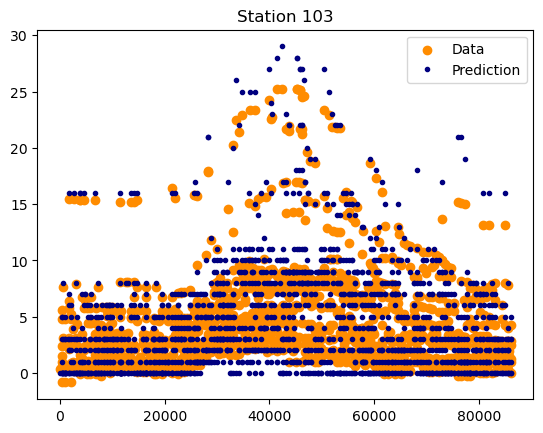

R^2: 0.93, Accuracy: 58.74%, MSE: 2.36


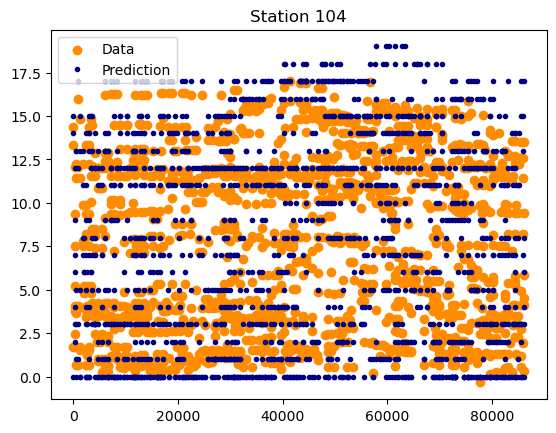

R^2: 0.95, Accuracy: 66.18%, MSE: 2.17


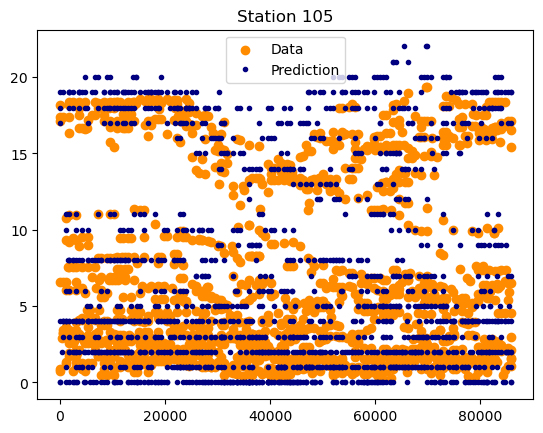

R^2: 0.90, Accuracy: 41.33%, MSE: 5.10


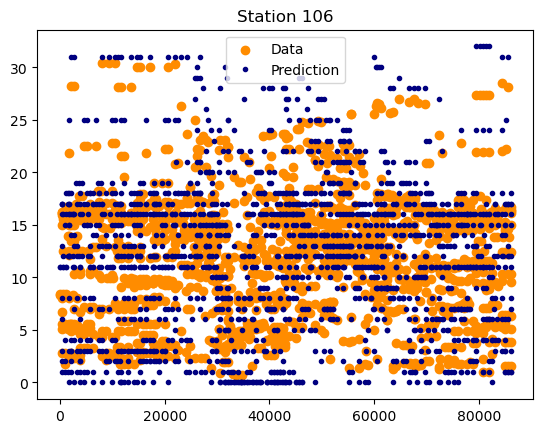

R^2: 0.92, Accuracy: 37.06%, MSE: 4.98


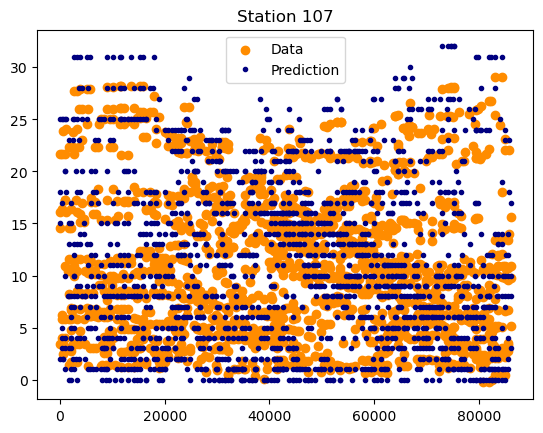

R^2: 0.91, Accuracy: 38.20%, MSE: 5.14


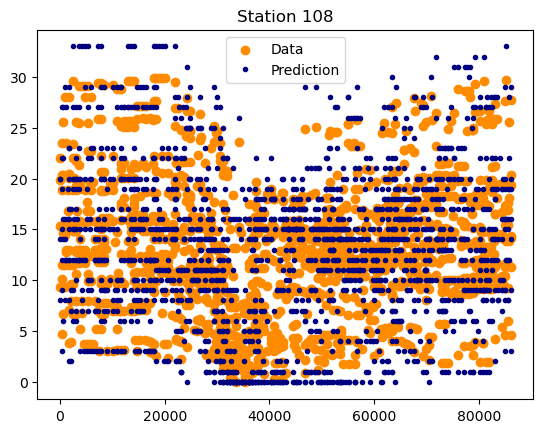

R^2: 0.95, Accuracy: 55.59%, MSE: 2.79


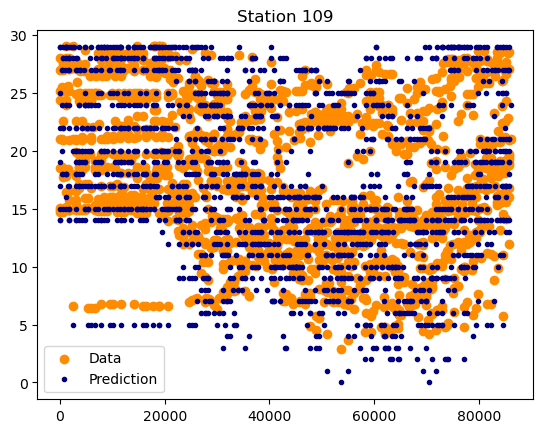

R^2: 0.95, Accuracy: 49.07%, MSE: 2.98


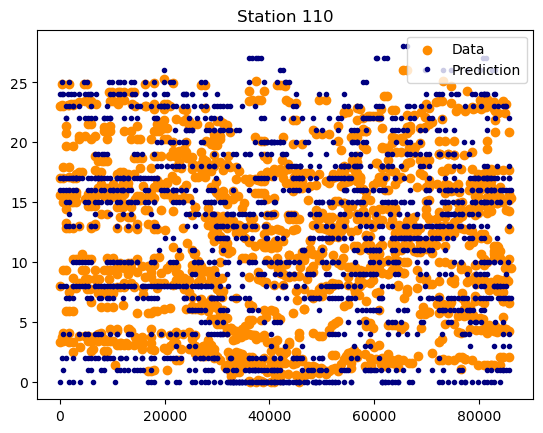

R^2: 0.95, Accuracy: 70.97%, MSE: 1.03


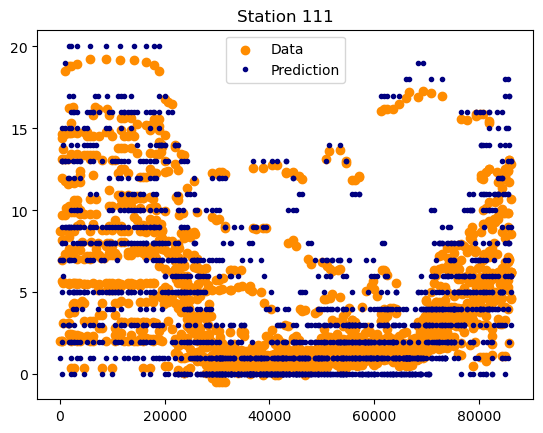

R^2: 0.96, Accuracy: 42.77%, MSE: 4.26


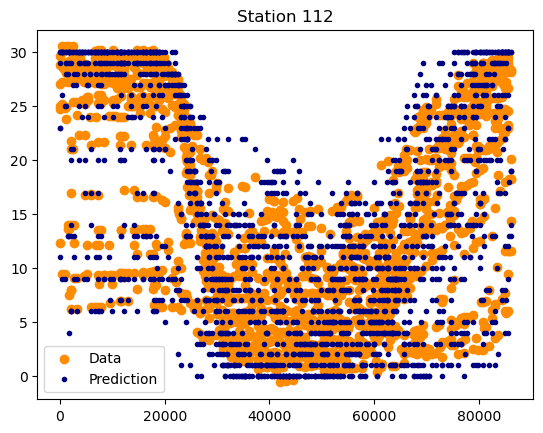

R^2: 0.98, Accuracy: 73.80%, MSE: 1.12


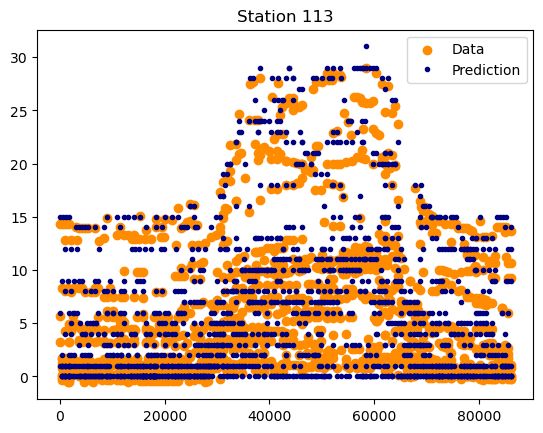

R^2: 0.96, Accuracy: 42.08%, MSE: 5.13


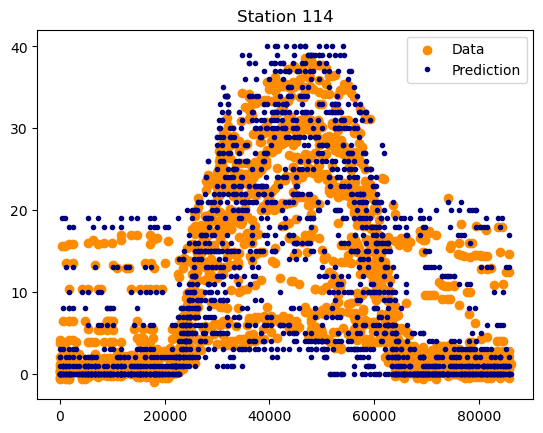

R^2: 0.96, Accuracy: 46.94%, MSE: 3.45


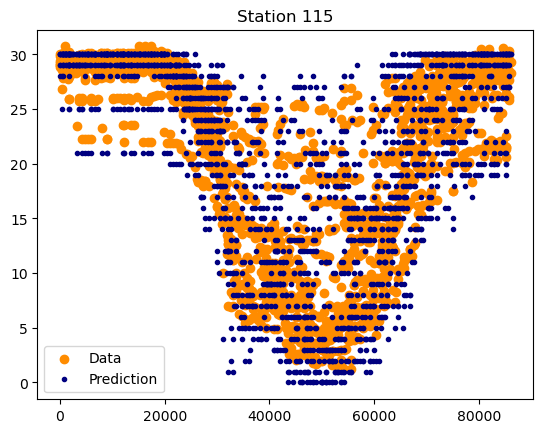

R^2: 0.94, Accuracy: 66.75%, MSE: 1.95


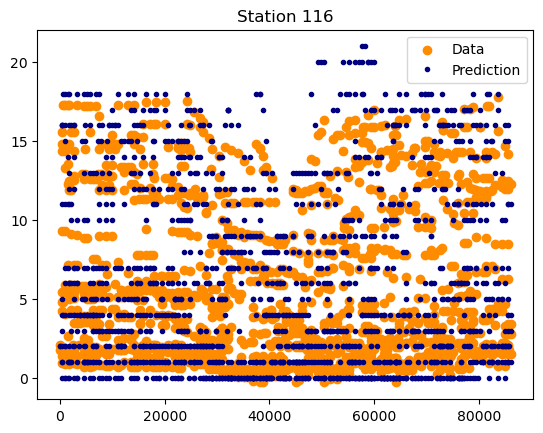

R^2: 0.97, Accuracy: 54.70%, MSE: 2.90


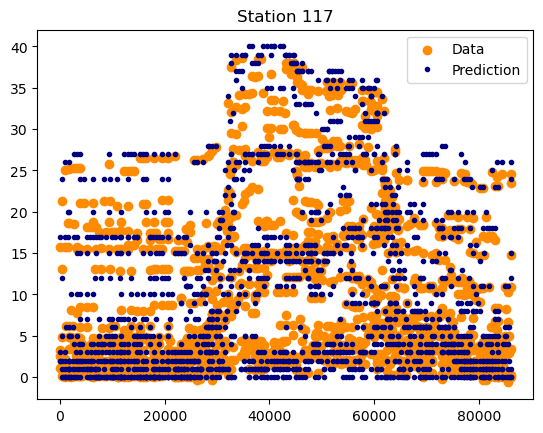

In [8]:
import pickle
predictions = []
per = []
from sklearn.ensemble import GradientBoostingRegressor
with PdfPages('RandForeststation_plots.pdf') as pdf:
    for num in station_number:
        x_set_num = x_set.loc[x_set['number'] == num]
        y_set_num = y_set[x_set['number'] == num]
        x_set_num.drop('number',axis=1)
        #scaler = StandardScaler()
        #x_scaled = scaler.fit_transform(x_set_num)
        #print(x_set_num.shape[0])
        highest  = y_set_num.max()
        reg1 = RandomForestRegressor(random_state=1)
        reg2 = GradientBoostingRegressor(random_state=0)
        reg3 = RandomForestRegressor(random_state=0)
        reg4 = GradientBoostingRegressor(random_state=1)
        ereg = VotingRegressor(estimators=[('gb', reg1), ('rf', reg2),('gb2', reg3), ('rf2', reg4)])

        x_train, x_test, y_train, y_test = train_test_split(x_set_num, y_set_num, test_size=0.33, random_state=42)
        reg = SGDRegressor(max_iter=1000, tol=1e-3)
        ereg = ereg.fit(x_train, y_train)
        y_pred = ereg.predict(x_test)
        #predictions[num] = y_pred
        count = 0
        for i in range(len(y_pred)):
            if abs(y_pred[i] - y_test.iloc[i]) <= 1:
                count += 1
        y_pred = ereg.predict(x_test)
        r2 = r2_score(y_test, y_pred)
        accuracy = np.mean(np.abs(y_pred - y_test) <= 1) * 100
        mse = np.mean((y_pred - y_test) ** 2)

        print(f"R^2: {r2:.2f}, Accuracy: {accuracy:.2f}%, MSE: {mse:.2f}")
        with open(f'model{num}.pkl', 'wb') as f:
            pickle.dump(ereg, f)

        plt.figure()
        plt.scatter(x_test['time_as_fraction'], y_pred, color="darkorange", label="Data")
        plt.plot(x_test['time_as_fraction'], y_test.to_numpy(), 'o', color="navy", label="Prediction", markersize=3)
        plt.axis("tight")
        plt.title(f"Station {num}")
        plt.legend()
        pdf.savefig()
        plt.show()